# 📌 COCO Dataset: Common Objects in Context

## 📝 ¿Qué es COCO?
COCO (**Common Objects in Context**) es un **conjunto de datos de visión por computadora** ampliamente utilizado en tareas de detección de objetos, segmentación y captioning de imágenes. Fue creado por Microsoft y es uno de los benchmarks más importantes en el campo de la **visión artificial**.

- **Tamaño:** Más de **330,000 imágenes** anotadas.
- **Clases:** **80 categorías** de objetos comunes (personas, vehículos, animales, muebles, alimentos, etc.).
- **Anotaciones:** Bounding boxes, segmentaciones de objetos, keypoints humanos y descripciones de imágenes.
- **Ediciones:** La más usada es **COCO 2017**, aunque hay versiones previas y actualizadas.

## 🏆 ¿Por qué elegí COCO para este proyecto?
COCO es ideal para mi investigación en detección de objetos porque:

1. **🔍 Diversidad de Clases:**  
   - Contiene **80 categorías** que representan objetos comunes en distintas escenas.
   - Es un dataset **desafiante**, lo que permite evaluar la capacidad del modelo para generalizar.

2. **📊 Anotaciones de Alta Calidad:**  
   - Proporciona **bounding boxes precisas** para detección de objetos.
   - También tiene **segmentaciones y keypoints** útiles para experimentos avanzados.

3. **💾 Gran Cantidad de Datos:**  
   - Con más de **118,000 imágenes de entrenamiento**, es lo suficientemente extenso para realizar **experimentos robustos**.

4. **⚖️ Benchmark Reconocido:**  
   - COCO se usa como referencia en muchas competiciones y papers de **visión por computadora**.
   - Permite comparar el rendimiento de **YOLO, Faster R-CNN y SSD** de manera justa.

5. **🛠️ Compatible con Modelos SOTA (State-of-the-Art):**  
   - YOLOv8, Faster R-CNN y otros modelos modernos están **entrenados y optimizados** en COCO.
   - Es fácil integrar **data augmentation** para mejorar la detección de objetos pequeños.

## 📂 Estructura del Dataset COCO

El dataset COCO está organizado en varias carpetas principales:

### 📁 Directorio principal: `datasets/coco/`
- `annotations/` → Contiene las anotaciones en formato JSON.
- `images/` → Carpeta con todas las imágenes.
- `labels/` → Etiquetas en formato YOLO (archivos `.txt`).
- `coco.yaml` → Archivo de configuración para entrenar YOLO.
- `README.txt` → Información general del dataset.
- `LICENSE` → Licencia del dataset.

### 📌 Detalle de las carpetas:
#### 📂 `annotations/` (Anotaciones en formato COCO) ==> De estas no usaremos todas, en principio nos quedamos solo con detección de objetos
- `instances_train2017.json` → Bounding boxes para entrenamiento.
- `instances_val2017.json` → Bounding boxes para validación.
- `captions_train2017.json` → Descripciones de imágenes para entrenamiento.
- `captions_val2017.json` → Descripciones de imágenes para validación.
- `person_keypoints_train2017.json` → Keypoints humanos para entrenamiento.
- `person_keypoints_val2017.json` → Keypoints humanos para validación.

#### 📂 `images/` (Imágenes del dataset)
- `train2017/` → Imágenes de entrenamiento (**118k imágenes**).
- `val2017/` → Imágenes de validación (**5k imágenes**).
- `test2017/` → Imágenes de prueba (opcional).

#### 📂 `labels/` (Etiquetas en formato YOLO)
- `train2017/` → Archivos `.txt` con bounding boxes para entrenamiento.
- `val2017/` → Archivos `.txt` con bounding boxes para validación.

---

### ✅ **Descripción general**
- **COCO proporciona anotaciones detalladas en formato JSON**, pero para YOLO es necesario convertirlas a `.txt`.
- **Las imágenes y las etiquetas están en carpetas separadas**, lo que permite mayor flexibilidad en la organización.
- **El archivo `coco.yaml`** es necesario para entrenar YOLO correctamente.



## 📌 Conclusión
COCO es la mejor opción para evaluar la efectividad de **data augmentation con modelos de difusión** en la detección de objetos. Su diversidad de clases, calidad de anotaciones y compatibilidad con modelos modernos lo convierten en el **benchmark ideal** para este proyecto.



In [2]:
from pycocotools.coco import COCO
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import torch
from PIL import Image
from diffusers import StableDiffusionImg2ImgPipeline

2025-02-13 08:18:31.722541: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-13 08:18:31.873516: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-13 08:18:31.909226: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-13 08:18:32.537308: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

## 📌 Carga de Anotaciones COCO

Este código carga las anotaciones del dataset **COCO** usando la biblioteca `pycocotools`. Se define la ruta del archivo de anotaciones (`instances_val2017.json`) y se inicializa un objeto `COCO` para acceder a los metadatos del dataset. Finalmente, se obtiene y muestra el número total de imágenes disponibles en la anotación.

In [2]:
# Definimos la ruta del archivo de annotations
data_dir = "/mnt/homeGPU/azapata/TFG/datasets/coco"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")

# Cargar anotaciones de COCO
coco = COCO(ann_file)

# Obtener el número total de imágenes
img_ids = coco.getImgIds()
print(f"✅ COCO cargado correctamente. Total de imágenes: {len(img_ids)}")

loading annotations into memory...
Done (t=0.64s)
creating index...
index created!
✅ COCO cargado correctamente. Total de imágenes: 5000


Visualizamos una imagen para ver que hemos cargado bien el dataset 

✅ Imagen encontrada: /mnt/homeGPU/azapata/TFG/datasets/coco/images/val2017/000000397133.jpg


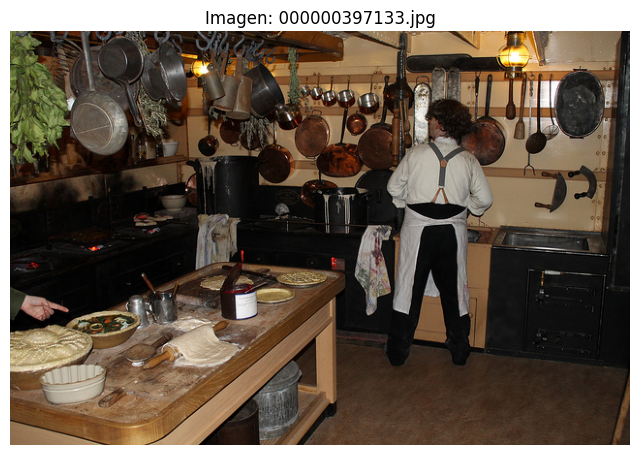

In [ ]:
# Obtener información de una imagen aleatoria
img_info = coco.loadImgs(img_ids[0])[0]
img_path = os.path.join(data_dir, "images/val2017", img_info["file_name"])

# Comprobar si la imagen existe
if not os.path.exists(img_path):
    print(f"⚠️ La imagen {img_path} NO existe. Puede que la descarga esté incompleta.")
else:
    print(f"✅ Imagen encontrada: {img_path}")

    # Cargar la imagen
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB

    # Mostrar la imagen
    plt.figure(figsize=(8,6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Imagen: {img_info['file_name']}")
    plt.show()


## 📌 Carga de Anotaciones COCO para Entrenamiento

Definimos la ruta del dataset COCO y cargamos las anotaciones del conjunto de **entrenamiento** (`instances_train2017.json`) utilizando la biblioteca `pycocotools`. Se inicializa un objeto `COCO` para acceder a los metadatos del dataset y se obtiene el número total de imágenes en el conjunto de entrenamiento.

In [4]:
# Definir la ruta del dataset
data_dir = "/mnt/homeGPU/azapata/TFG/datasets/coco"
ann_file = "/mnt/homeGPU/azapata/TFG/datasets/coco/annotations/annotations/instances_train2017.json"

# Cargar COCO
coco = COCO(ann_file)

# Obtener el número total de imágenes
img_ids = coco.getImgIds()
print(f"✅ COCO cargado correctamente. Total de imágenes en train2017: {len(img_ids)}")


loading annotations into memory...


Done (t=14.85s)
creating index...
index created!
✅ COCO cargado correctamente. Total de imágenes en train2017: 118287


**Visualizamos las categorías cargadas para verificar que coinciden con las del dataset y con la información del README en la documentación.**

In [5]:
cat_ids = coco.getCatIds()
categories = coco.loadCats(cat_ids)
category_names = [cat["name"] for cat in categories]

print("📋 Clases en COCO:")
print(category_names)

📋 Clases en COCO:
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


Contamos el número de imágenes por categoría en el dataset COCO y mostramos las 10 categorías con más imágenes para analizar su distribución.

In [6]:
category_count = {}

for cat in categories:
    cat_id = cat["id"]
    img_count = len(coco.getImgIds(catIds=[cat_id]))
    category_count[cat["name"]] = img_count

# Mostrar las 10 categorías con más imágenes
sorted_categories = sorted(category_count.items(), key=lambda x: x[1], reverse=True)
for category, count in sorted_categories[:10]:
    print(f"{category}: {count} imágenes")

person: 64115 imágenes
chair: 12774 imágenes
car: 12251 imágenes
dining table: 11837 imágenes
cup: 9189 imágenes
bottle: 8501 imágenes
bowl: 7111 imágenes
handbag: 6841 imágenes
truck: 6127 imágenes
bench: 5570 imágenes


### 📌 Visualización de una Imagen Aleatoria con Anotaciones COCO

Este código selecciona una imagen aleatoria del conjunto de **entrenamiento** de COCO (`train2017`), carga sus anotaciones y dibuja sus **bounding boxes** con las categorías correspondientes.

### 🔹 Pasos:
1. **Cargar COCO** desde `instances_train2017.json`.
2. **Seleccionar una imagen aleatoria** y verificar su existencia.
3. **Cargar la imagen** y obtener sus anotaciones.
4. **Dibujar bounding boxes** con sus respectivas categorías.
5. **Mostrar la imagen anotada** con `matplotlib`.

loading annotations into memory...


Done (t=15.21s)
creating index...
index created!
✅ Imagen encontrada: /mnt/homeGPU/azapata/TFG/datasets/coco/images/train2017/000000495031.jpg


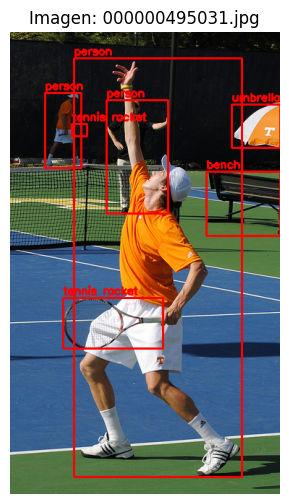

In [7]:
# Definir la ruta del dataset
data_dir = "/mnt/homeGPU/azapata/TFG/datasets/coco"
ann_file = os.path.join(data_dir, "annotations/annotations", "instances_train2017.json")

# Cargar COCO
coco = COCO(ann_file)

# Obtener una imagen aleatoria del dataset
img_ids = coco.getImgIds()
random_img_id = random.choice(img_ids)  # Escoge un ID aleatorio
img_info = coco.loadImgs(random_img_id)[0]
img_path = os.path.join(data_dir, "images", "train2017", img_info["file_name"])  # RUTA CORREGIDA

# Comprobar si la imagen realmente existe
if not os.path.exists(img_path):
    print(f"⚠️ La imagen {img_path} NO existe.")
else:
    print(f"✅ Imagen encontrada: {img_path}")

    # Cargar la imagen
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Obtener anotaciones (bounding boxes)
    ann_ids = coco.getAnnIds(imgIds=img_info["id"])
    anns = coco.loadAnns(ann_ids)

    # Dibujar bounding boxes
    for ann in anns:
        x, y, w, h = ann["bbox"]
        class_id = ann["category_id"]
        class_name = coco.loadCats([class_id])[0]["name"]
        

        # Dibujar rectángulo y etiqueta
        cv2.rectangle(image, (int(x), int(y)), (int(x + w), int(y + h)), (255, 0, 0), 2)
        cv2.putText(image, class_name, (int(x), int(y) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Mostrar la imagen con bounding boxes
    plt.figure(figsize=(8,6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Imagen: {img_info['file_name']}")
    plt.show()


Se inicializa CUDA, se verifica su disponibilidad y se muestra el nombre de la GPU en uso, asignando `"cuda"` o `"cpu"` según corresponda.

Queremos que se ejecute en **GPU**.

In [5]:
torch.cuda.init()
print(torch.cuda.is_available())  # Debe devolver True 
# Verificar si CUDA está disponible
print(f"CUDA disponible: {torch.cuda.is_available()}")
print(f"GPU en uso: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'Ninguna'}")

device = "cuda" if torch.cuda.is_available() else "cpu"

True
CUDA disponible: True
GPU en uso: Quadro RTX 8000


## 📌 Carga de un Modelo de Difusión para Data Augmentation

Este código carga un modelo de **Stable Diffusion** preentrenado para generación de imágenes a partir de imágenes (`img2img`), lo que permite realizar **data augmentation** mediante modelos de difusión.

### 🔹 ¿Por qué este modelo y no otros?
Se ha elegido **"SG161222/Realistic_Vision_V5.1_noVAE"** porque:
- **✅ Genera imágenes realistas** con alta fidelidad a los detalles.
- **✅ Especializado en transferencia de estilos y mejora de detalles**, lo que es útil para data augmentation en detección de objetos pequeños.
- **✅ No utiliza VAE**, lo que permite conservar mejor los detalles originales sin una compresión agresiva.
- **✅ Soporta `float16`**, optimizando el uso de memoria en GPU y permitiendo procesar más imágenes en paralelo.

Otros modelos como **Stable Diffusion 1.5 o 2.1** pueden generar imágenes más genéricas, pero este modelo en particular **ofrece una mayor calidad en la preservación de estructuras y texturas**, lo que es clave para mejorar el dataset sin introducir ruido irrelevante.

Este modelo se utilizará para generar **nuevas versiones de imágenes del dataset**, incrementando la diversidad de ejemplos sin perder coherencia en la distribución de datos. 🚀


In [ ]:
import diffusers
import torch
from diffusers import StableDiffusionImg2ImgPipeline

# pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
#     "SG161222/Realistic_Vision_V5.1_noVAE",
#     torch_dtype=torch.float16
# ).to(device)

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "models/Realistic_Vision",  # Ruta local del modelo
    torch_dtype=torch.float16
).to(device)

print(f"Modelo cargado en: {pipe.device}")

Couldn't connect to the Hub: 401 Client Error. (Request ID: Root=1-67adabe2-1f5851743a26ce6601174ec9;0ab8a31b-a7f4-41b4-8c14-62bccd83c809)

Repository Not Found for url: https://huggingface.co/api/models/SG161222/Realistic_Vision_V5.1_noVAE.
Please make sure you specified the correct `repo_id` and `repo_type`.
If you are trying to access a private or gated repo, make sure you are authenticated.
Invalid credentials in Authorization header.
Will try to load from local cache.


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Modelo cargado en: cuda:0


Guardamos el modelo para que no "desaparezca" en el futuro

In [7]:
!git clone https://huggingface.co/SG161222/Realistic_Vision_V5.1_noVAE models/Realistic_Vision

Cloning into 'models/Realistic_Vision'...
remote: Enumerating objects: 47, done.
remote: Total 47 (delta 0), reused 0 (delta 0), pack-reused 47 (from 1)
Unpacking objects: 100% (47/47), 519.84 KiB | 1.14 MiB/s, done.
Filtering content: 100% (11/11), 27.80 GiB | 19.97 MiB/s, done.


## 📌 Generación de Nuevas Versiones de Objetos con Modelos de Difusión

Este código toma una imagen aleatoria del conjunto de **entrenamiento de COCO**, identifica los objetos en ella y genera **nuevas versiones** de estos objetos utilizando un **modelo de difusión**.  

### 🔹 Intuición del Proceso:
1. **Seleccionar una imagen aleatoria** y cargar sus bounding boxes (`BB`).
2. **Para cada objeto detectado**:
   - Se recorta la región correspondiente a la bounding box.
   - Se genera un **prompt aleatorio** con una combinación de estilo y resolución para guiar el modelo de difusión:
     ```python
     prompt = f"A {class_name} in a {style} style, {resolution} resolution, ultra-detailed, hiper-ultra-mega-realistic."
     ```
   - Se pasa la imagen recortada y el prompt al modelo de difusión:
     ```python
     generated_image = pipe(
         prompt=prompt,
         image=cropped_image,
         strength=0.3,  # Controla cuánto cambia la imagen (0 = poco, 1 = mucho)
         guidance_scale=10,  # Controla cuánto sigue el prompt
         num_inference_steps=100
     ).images[0]
     ```
   - Se ajusta la imagen generada para que encaje en la bounding box original.
   - Se reemplaza el objeto original en la imagen con la nueva versión generada.
3. **Visualizar los resultados**:
   - Imagen original.
   - Imagen con bounding boxes resaltadas.
   - Imagen final con los objetos modificados.

## 🔹 Objetivo:
Este enfoque permite generar **versiones alternativas de los objetos existentes**, lo que ayuda a aumentar la diversidad del dataset y mejorar la capacidad de generalización de modelos de detección de objetos **sin necesidad de reetiquetar**. 🚀

#### 🔹 Esto se repetirá en celdas de código posteriormente donde estudio cómo se comporta con otros ejemplos, posibles problemáticas y el ajuste de hiperparámetros



  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

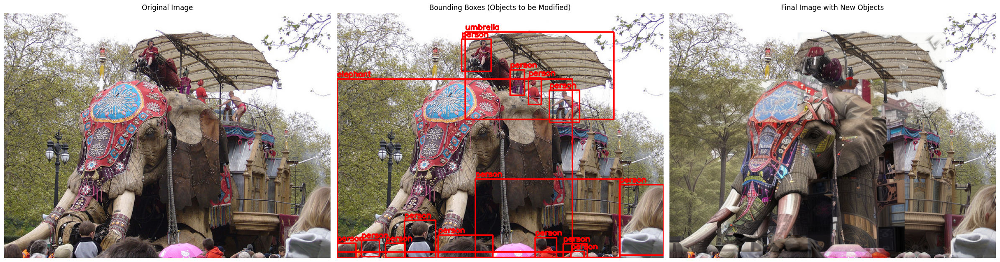

In [16]:
# Obtener una imagen aleatoria
img_ids = coco.getImgIds()
random_img_id = random.choice(img_ids)
img_info = coco.loadImgs(random_img_id)[0]
img_path = os.path.join(data_dir, "images", "train2017", img_info["file_name"])

# Cargar la imagen original
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image)
im_og = image_pil.copy()  # Guardar copia de la imagen original
image_with_boxes = image.copy()  # Imagen para visualizar bounding boxes

# Obtener anotaciones (bounding boxes)
ann_ids = coco.getAnnIds(imgIds=img_info["id"])
anns = coco.loadAnns(ann_ids)

# Dibujar las bounding boxes en una copia de la imagen original
for ann in anns:
    x, y, w, h = ann["bbox"]
    class_id = ann["category_id"]
    class_name = coco.loadCats([class_id])[0]["name"]

    # Dibujar bounding box
    cv2.rectangle(image_with_boxes, (int(x), int(y)), (int(x + w), int(y + h)), (255, 0, 0), 2)
    cv2.putText(image_with_boxes, class_name, (int(x), int(y) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# **Iterar sobre todas las bounding boxes en la imagen**
for ann in anns:
    x, y, w, h = ann["bbox"]
    class_id = ann["category_id"]
    class_name = coco.loadCats([class_id])[0]["name"]

    # **Recortar el objeto detectado**
    xmin, ymin, xmax, ymax = int(x), int(y), int(x + w), int(y + h)
    cropped_image = image_pil.crop((xmin, ymin, xmax, ymax))
    cropped_image = cropped_image.resize((512, 512), Image.Resampling.LANCZOS)

    # **Generar un prompt específico para el objeto**
    styles = [
        "futuristic", "retro", "industrial", "modern", "steampunk", "cyberpunk",
        "minimalist", "vintage", "art deco", "gothic", "organic", "baroque",
        "medieval", "traditional Japanese", "neoclassical", "high-tech", "biomechanical",
        "deconstructivist", "surrealist", "afrofuturist", "tribal", "art nouveau",
        "expressionist", "conceptual", "abstract", "brutalist", "neonwave", "low-poly",
        "aerodynamic", "cyber-organic", "dystopian", "mechanized", "hyper-realistic",
        "muscle car-inspired", "AI-generated", "luxury sports edition", "battle-hardened",
        "tactical", "racing-inspired", "cinematic concept", "NASA-engineered",
        "eco-friendly futuristic", "post-apocalyptic rugged", "sleek aerodynamic prototype"
    ]
    
    resolutions = ["high", "medium", "low"]
    
    resolution = random.choice(resolutions)
    style = random.choice(styles)

    prompt = (
        f"A {class_name} in a {style} style, {resolution} resolution, ultra-detailed, hiper-ultra-mega-realistic."
    )
    
    # **Pasar la imagen recortada al modelo de difusión**
    generated_image = pipe(
        prompt=prompt,
        image=cropped_image,
        strength=0.3,  # Controla cuánto cambia la imagen (0 = poco, 1 = mucho)
        guidance_scale=10,  # Controla cuánto sigue el prompt
        num_inference_steps=100
    ).images[0]

    # **Redimensionar la imagen generada para encajar en la bounding box**
    generated_resized = generated_image.resize((xmax - xmin, ymax - ymin), Image.Resampling.LANCZOS)

    # **Pegar la imagen generada sobre la región original**
    image_pil.paste(generated_resized, (xmin, ymin))

# **Visualización de resultados**
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

axs[0].imshow(im_og)
axs[0].set_title("Original Image")
axs[0].axis("off")

axs[1].imshow(image_with_boxes)
axs[1].set_title("Bounding Boxes (Objects to be Modified)")
axs[1].axis("off")

axs[2].imshow(image_pil)
axs[2].set_title("Final Image with New Objects")
axs[2].axis("off")

plt.tight_layout()
plt.show()

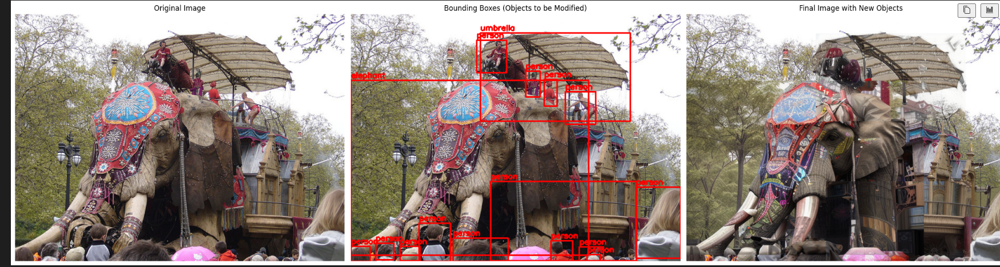

## 📌 Evaluación de Resultados: Casos de Éxito y Problemas  

Al aplicar **data augmentation con modelos de difusión**, se observan resultados **variables** dependiendo del objeto y su contexto en la imagen.  

### 🔹 Observaciones en la Imagen Generada:
- ✅ **Caso de éxito**:  
  - El **elefante** ha sido modificado con un nuevo estilo, manteniendo su forma y estructura original.  
  - El modelo respeta la **coherencia visual** y aplica los cambios sin distorsionar el objeto.  

- ⚠️ **Problema con objetos superpuestos**:  
  - Las **personas en la imagen han desaparecido** después de la transformación.  
  - Es posible que el modelo de difusión no haya identificado correctamente los objetos debido a **superposiciones o tamaños pequeños**, generando una imagen sin conservar todas las instancias originales.  

### 🔹 Conclusión:
Este análisis muestra que el método es **efectivo para algunos objetos**, pero presenta dificultades cuando hay **oclusiones o superposiciones**. Se pueden explorar ajustes en los parámetros del modelo de difusión o en la forma en que se generan y procesan las bounding boxes para mejorar los resultados. 🚀


## 📌 Evaluación de Resultados (II): Casos de Éxito y Problemas con Objetos Superpuestos  

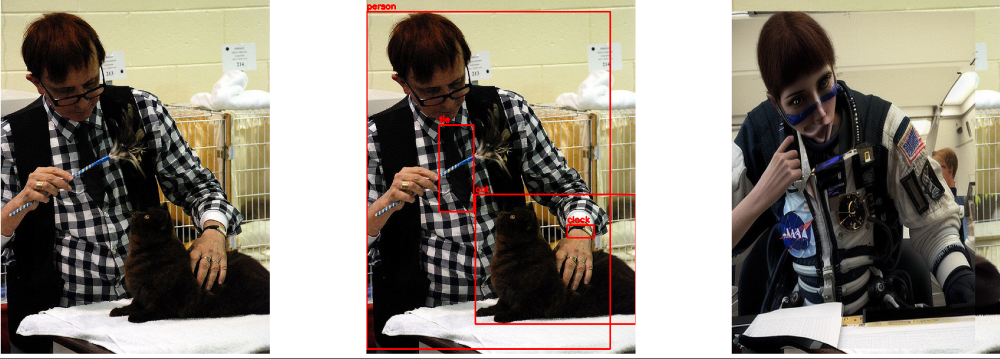

Al aplicar **data augmentation con modelos de difusión**, se observan distintos comportamientos en función de la disposición de los objetos en la imagen.  

### 🔹 Observaciones Generales:

- ⚠️ **Problema con objetos superpuestos**:
  - En imágenes con **múltiples objetos en distintos planos**, el modelo no siempre mantiene la cohesión.  
  - En el primer ejemplo, las **personas desaparecen** al aplicar el modelo de difusión.  
  - En el caso del **reloj de muñeca**, se genera antes de la persona, lo que provoca que el objeto quede oculto cuando la persona se superpone.  

### 🔹 Propuesta de Solución: Procesar de Mayor a Menor
Para evitar inconsistencias en la superposición de objetos, se establece el siguiente criterio:  
1. **Generar primero los objetos más grandes** (ejemplo: personas, muebles, vehículos).  
2. **Añadir progresivamente los objetos más pequeños** (ejemplo: relojes, accesorios, herramientas).  
3. **Garantizar que los objetos en primer plano no sean reemplazados por los del fondo**.  

No obstante, esta propuesta no es una solución **definitiva**, ya que pueden existir casos en los que objetos grandes oculten a los pequeños y viceversa, por lo que no siempre se seguirá este patrón de superposición.

### 🔹 Conclusión:
Este ajuste en la estrategia de generación debería mejorar la **coherencia de los objetos en la imagen final**, asegurando que elementos importantes no sean ocultados o eliminados por error. 🚀  

## 📌 Continuamos haciendo experimentos con otras imágenes

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

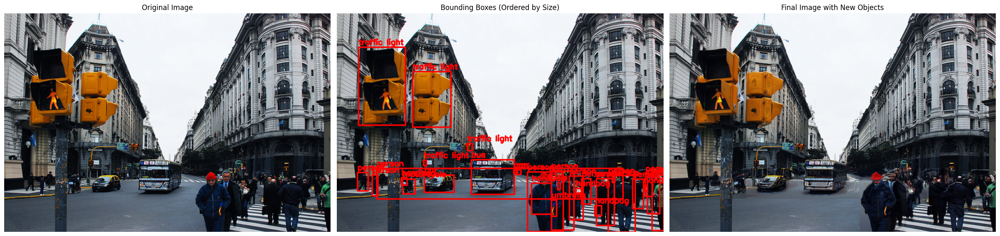

In [18]:
random.seed(42)
# Obtener una imagen aleatoria
img_ids = coco.getImgIds()
random_img_id = random.choice(img_ids)
img_info = coco.loadImgs(random_img_id)[0]
img_path = os.path.join(data_dir, "images", "train2017", img_info["file_name"])

# Cargar la imagen original
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image)
im_og = image_pil.copy()  # Guardar copia de la imagen original
image_with_boxes = image.copy()  # Imagen para visualizar bounding boxes

# Obtener anotaciones (bounding boxes)
ann_ids = coco.getAnnIds(imgIds=img_info["id"])
anns = coco.loadAnns(ann_ids)

# **Ordenar las bounding boxes por área de mayor a menor**
anns.sort(key=lambda ann: ann["bbox"][2] * ann["bbox"][3], reverse=True)

# Dibujar las bounding boxes en una copia de la imagen original antes de la modificación
for ann in anns:
    x, y, w, h = ann["bbox"]
    class_id = ann["category_id"]
    class_name = coco.loadCats([class_id])[0]["name"]

    # Dibujar bounding box
    cv2.rectangle(image_with_boxes, (int(x), int(y)), (int(x + w), int(y + h)), (255, 0, 0), 2)
    cv2.putText(image_with_boxes, class_name, (int(x), int(y) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# **Iterar sobre las bounding boxes (de mayor a menor tamaño)**
for ann in anns:
    x, y, w, h = ann["bbox"]
    class_id = ann["category_id"]
    class_name = coco.loadCats([class_id])[0]["name"]

    # **Recortar el objeto detectado**
    xmin, ymin, xmax, ymax = int(x), int(y), int(x + w), int(y + h)
    cropped_image = image_pil.crop((xmin, ymin, xmax, ymax))
    cropped_image = cropped_image.resize((512, 512), Image.Resampling.LANCZOS)

    # **Generar un prompt específico para el objeto**
    styles = [
        "futuristic", "retro", "industrial", "modern", "steampunk", "cyberpunk",
        "minimalist", "vintage", "art deco", "gothic", "organic", "baroque",
        "medieval", "traditional Japanese", "neoclassical", "high-tech", "biomechanical",
        "deconstructivist", "surrealist", "afrofuturist", "tribal", "art nouveau",
        "expressionist", "conceptual", "abstract", "brutalist", "neonwave", "low-poly",
        "aerodynamic", "cyber-organic", "dystopian", "mechanized", "hyper-realistic",
        "muscle car-inspired", "AI-generated", "luxury sports edition", "battle-hardened",
        "tactical", "racing-inspired", "cinematic concept", "NASA-engineered",
        "eco-friendly futuristic", "post-apocalyptic rugged", "sleek aerodynamic prototype"
    ]
    
    resolutions = ["high", "medium", "low"]
    
    resolution = random.choice(resolutions)
    style = random.choice(styles)

    prompt = (
        f"A {class_name} in a {style} style, {resolution} resolution, ultra-detailed. Change colors of the object"
    )
    
    # **Pasar la imagen recortada al modelo de difusión**
    generated_image = pipe(
        prompt=prompt,
        image=cropped_image,
        strength=0.25,  # Controla cuánto cambia la imagen (0 = poco, 1 = mucho)
        guidance_scale=8,  # Controla cuánto sigue el prompt
        num_inference_steps=100
    ).images[0]

    # **Redimensionar la imagen generada para encajar en la bounding box**
    generated_resized = generated_image.resize((xmax - xmin, ymax - ymin), Image.Resampling.LANCZOS)

    # **Pegar la imagen generada sobre la región original**
    image_pil.paste(generated_resized, (xmin, ymin))

# **Visualización de resultados**
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

axs[0].imshow(im_og)
axs[0].set_title("Original Image")
axs[0].axis("off")

axs[1].imshow(image_with_boxes)
axs[1].set_title("Bounding Boxes (Ordered by Size)")
axs[1].axis("off")

axs[2].imshow(image_pil)
axs[2].set_title("Final Image with New Objects")
axs[2].axis("off")

plt.tight_layout()
plt.show()

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

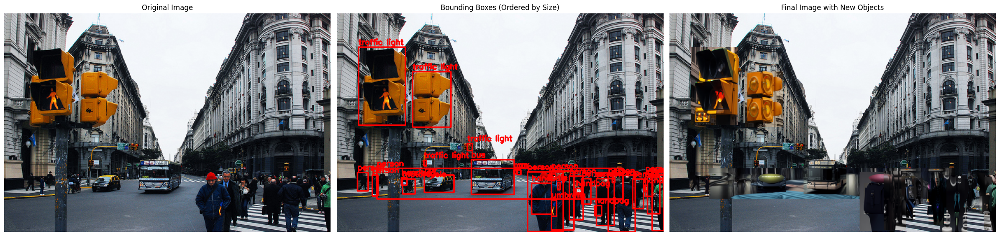

In [21]:
random.seed(42)
# Obtener una imagen aleatoria
img_ids = coco.getImgIds()
random_img_id = random.choice(img_ids)
img_info = coco.loadImgs(random_img_id)[0]
img_path = os.path.join(data_dir, "images", "train2017", img_info["file_name"])

# Cargar la imagen original
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image)
im_og = image_pil.copy()  # Guardar copia de la imagen original
image_with_boxes = image.copy()  # Imagen para visualizar bounding boxes

# Obtener anotaciones (bounding boxes)
ann_ids = coco.getAnnIds(imgIds=img_info["id"])
anns = coco.loadAnns(ann_ids)

# **Ordenar las bounding boxes por área de mayor a menor**
anns.sort(key=lambda ann: ann["bbox"][2] * ann["bbox"][3], reverse=True)

# Dibujar las bounding boxes en una copia de la imagen original antes de la modificación
for ann in anns:
    x, y, w, h = ann["bbox"]
    class_id = ann["category_id"]
    class_name = coco.loadCats([class_id])[0]["name"]

    # Dibujar bounding box
    cv2.rectangle(image_with_boxes, (int(x), int(y)), (int(x + w), int(y + h)), (255, 0, 0), 2)
    cv2.putText(image_with_boxes, class_name, (int(x), int(y) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# **Iterar sobre las bounding boxes (de mayor a menor tamaño)**
for ann in anns:
    x, y, w, h = ann["bbox"]
    class_id = ann["category_id"]
    class_name = coco.loadCats([class_id])[0]["name"]

    # **Recortar el objeto detectado**
    xmin, ymin, xmax, ymax = int(x), int(y), int(x + w), int(y + h)
    cropped_image = image_pil.crop((xmin, ymin, xmax, ymax))
    cropped_image = cropped_image.resize((512, 512), Image.Resampling.LANCZOS)

    # **Generar un prompt específico para el objeto**
    styles = [
        "futuristic", "retro", "industrial", "modern", "steampunk", "cyberpunk",
        "minimalist", "vintage", "art deco", "gothic", "organic", "baroque",
        "medieval", "traditional Japanese", "neoclassical", "high-tech", "biomechanical",
        "deconstructivist", "surrealist", "afrofuturist", "tribal", "art nouveau",
        "expressionist", "conceptual", "abstract", "brutalist", "neonwave", "low-poly",
        "aerodynamic", "cyber-organic", "dystopian", "mechanized", "hyper-realistic",
        "muscle car-inspired", "AI-generated", "luxury sports edition", "battle-hardened",
        "tactical", "racing-inspired", "cinematic concept", "NASA-engineered",
        "eco-friendly futuristic", "post-apocalyptic rugged", "sleek aerodynamic prototype"
    ]
    
    resolutions = ["high", "medium", "low"]
    
    resolution = random.choice(resolutions)
    style = random.choice(styles)

    prompt = (
        f"A {class_name} in a {style} style, {resolution} resolution, ultra-detailed. Change colors of the object"
    )
    
    # **Pasar la imagen recortada al modelo de difusión**
    generated_image = pipe(
        prompt=prompt,
        image=cropped_image,
        strength=0.65,  # Controla cuánto cambia la imagen (0 = poco, 1 = mucho)
        guidance_scale=5,  # Controla cuánto sigue el prompt
        num_inference_steps=100
    ).images[0]

    # **Redimensionar la imagen generada para encajar en la bounding box**
    generated_resized = generated_image.resize((xmax - xmin, ymax - ymin), Image.Resampling.LANCZOS)

    # **Pegar la imagen generada sobre la región original**
    image_pil.paste(generated_resized, (xmin, ymin))

# **Visualización de resultados**
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

axs[0].imshow(im_og)
axs[0].set_title("Original Image")
axs[0].axis("off")

axs[1].imshow(image_with_boxes)
axs[1].set_title("Bounding Boxes (Ordered by Size)")
axs[1].axis("off")

axs[2].imshow(image_pil)
axs[2].set_title("Final Image with New Objects")
axs[2].axis("off")

plt.tight_layout()
plt.show()


Observamos que algunas clases podrían no ser adecuadas para el reemplazo, como los semáforos, que mantienen una apariencia uniforme y no aportan variabilidad significativa al dataset.

---

# 📌 Problemas Identificados

1. **Superposición de imágenes**  
   - Es necesario establecer un orden lógico en la generación.  
   - En casos de **superposición excesiva**, puede ser mejor no aplicar modificaciones.  

2. **Imágenes de baja calidad**  
   - Similar a lo observado en **VisDrone**, una imagen de mala calidad puede generar otra de mala calidad.  
   - A veces esto es positivo porque mejora la nitidez, pero en otros casos afecta la composición general de la imagen.  

3. **Grado de alteración y superposición**  
   - **Alteración baja** → Funciona mejor en imágenes con mucha superposición.  
   - **Alteración alta** → Funciona mejor en imágenes sin superposición, ya que permite una mayor modificación y diversidad, que es el objetivo principal.  

---

## 💡 Posibles Soluciones

- **Generar primero los objetos grandes y luego los pequeños**  
  - Ejemplo: En una imagen con una **persona y un reloj de muñeca**, primero se debe generar la persona y luego el reloj.  

- **No modificar imágenes con una superposición extrema**  
  - En escenarios con **mucha gente u objetos solapados**, es preferible evitar la regeneración para mantener la coherencia.  

- **Ajustar la creatividad según la superposición**  
  - **Menos superposición** → Mayor creatividad en la generación.  
  - **Más superposición** → Menor creatividad para preservar la estructura original.  

- **Evitar la modificación de objetos demasiado uniformes**  
  - Ejemplo: **Semáforos**, que mantienen una apariencia similar en todas las imágenes y no aportan variabilidad significativa al dataset.  


# **🔹 Primera Aproximación**  

Aplicaremos **data augmentation con modelos de difusión** únicamente a aquellas bounding boxes que **no estén superpuestas con ninguna otra**. Para ello, desarrollaremos una función que, a partir de etiquetas en formato **YOLO**, identifique las bounding boxes que no presentan solapamiento con otras.  

A estas bounding boxes les aplicaremos el **data augmentation** utilizando modelos de difusión, siguiendo el enfoque del código anterior. Finalmente, guardaremos la nueva versión de la imagen **solo si ha sido modificada**, junto con su archivo de etiquetas actualizado. Dado que las bounding boxes permanecen inalteradas, el archivo de etiquetas se mantendrá sin cambios. 

In [8]:
# 📌 Directorio de imágenes y etiquetas
image_dir = "/mnt/homeGPU/azapata/TFG/datasets/coco/coco_20/images/train2017"
label_dir = "/mnt/homeGPU/azapata/TFG/datasets/coco/coco_20/labels/train2017"
output_dir = "/mnt/homeGPU/azapata/TFG/datasets/coco/coco_20_DM_augmented"

# 📌 Cargar el modelo de difusión
device = "cuda" if torch.cuda.is_available() else "cpu"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "models/Realistic_Vision",  # Ruta local del modelo
    torch_dtype=torch.float16
).to(device)

# 📌 Diccionario con las clases de COCO
COCO_CLASSES = {
    0: "person", 1: "bicycle", 2: "car", 3: "motorcycle", 4: "airplane",
    5: "bus", 6: "train", 7: "truck", 8: "boat", 9: "traffic light",
    10: "fire hydrant", 11: "stop sign", 12: "parking meter", 13: "bench",
    14: "bird", 15: "cat", 16: "dog", 17: "horse", 18: "sheep", 19: "cow",
    20: "elephant", 21: "bear", 22: "zebra", 23: "giraffe", 24: "backpack",
    25: "umbrella", 26: "handbag", 27: "tie", 28: "suitcase", 29: "frisbee",
    30: "skis", 31: "snowboard", 32: "sports ball", 33: "kite",
    34: "baseball bat", 35: "baseball glove", 36: "skateboard",
    37: "surfboard", 38: "tennis racket", 39: "bottle", 40: "wine glass",
    41: "cup", 42: "fork", 43: "knife", 44: "spoon", 45: "bowl",
    46: "banana", 47: "apple", 48: "sandwich", 49: "orange", 50: "broccoli",
    51: "carrot", 52: "hot dog", 53: "pizza", 54: "donut", 55: "cake",
    56: "chair", 57: "couch", 58: "potted plant", 59: "bed",
    60: "dining table", 61: "toilet", 62: "tv", 63: "laptop", 64: "mouse",
    65: "remote", 66: "keyboard", 67: "cell phone", 68: "microwave",
    69: "oven", 70: "toaster", 71: "sink", 72: "refrigerator", 73: "book",
    74: "clock", 75: "vase", 76: "scissors", 77: "teddy bear",
    78: "hair dryer", 79: "toothbrush"
}

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [9]:

# 📌 Función para calcular la intersección de dos bounding boxes
def iou(bb1, bb2):
    """Calcula la Intersección sobre la Unión (IoU) entre dos bounding boxes."""
    x1, y1, w1, h1 = bb1
    x2, y2, w2, h2 = bb2

    # Coordenadas de la intersección
    xi1, yi1 = max(x1, x2), max(y1, y2)
    xi2, yi2 = min(x1 + w1, x2 + w2), min(y1 + h1, y2 + h2)

    # Área de intersección
    inter_width = max(0, xi2 - xi1)
    inter_height = max(0, yi2 - yi1)
    inter_area = inter_width * inter_height

    # Área total de ambas BB
    area1, area2 = w1 * h1, w2 * h2
    union_area = area1 + area2 - inter_area

    return inter_area / union_area if union_area > 0 else 0

In [10]:
# 📌 Función para obtener bounding boxes no superpuestas
def get_non_overlapping_boxes(bboxes, iou_threshold=0.05):
    """Filtra las bounding boxes que no tienen superposición con ninguna otra."""
    non_overlapping = []
    for i, bb1 in enumerate(bboxes):
        overlaps = any(iou(bb1, bb2) > iou_threshold for j, bb2 in enumerate(bboxes) if i != j)
        if not overlaps:
            non_overlapping.append(bb1)
    return non_overlapping

In [11]:
# 📌 Aplicar data augmentation con difusión a bounding boxes seleccionadas
def apply_diffusion(image, bboxes):
    """Genera nuevas versiones de los objetos en las bounding boxes usando Stable Diffusion."""
    image_pil = Image.fromarray(image)
    modified = False

    for class_id, (x, y, w, h) in bboxes:
        class_name = COCO_CLASSES.get(class_id, "object")  # Obtener el nombre de la clase
        cropped_image = image_pil.crop((x, y, x + w, y + h))
        cropped_image = cropped_image.resize((512, 512), Image.Resampling.LANCZOS)

        prompt = f"Ultra-realistic {class_name} in a high-quality setting, detailed, photorealistic"

        generated_image = pipe(
            prompt=prompt,
            image=cropped_image,
            strength=0.4,  # Controla cuánto cambia la imagen (0 = poco, 1 = mucho)
            guidance_scale=7,  # Controla cuánto sigue el prompt
            num_inference_steps=50
        ).images[0]

        # Redimensionar al tamaño original y reemplazar en la imagen
        generated_resized = generated_image.resize((w, h), Image.Resampling.LANCZOS)
        image_pil.paste(generated_resized, (x, y))
        modified = True

    return image_pil if modified else None  # Si la imagen no se modificó, devuelve None

In [12]:
# 📌 Procesar imágenes y etiquetas
for label_file in os.listdir(label_dir):
    if not label_file.endswith(".txt"):
        continue  # Saltar archivos no etiquetados
    
    image_file = label_file.replace(".txt", ".jpg")
    image_path = os.path.join(image_dir, image_file)
    label_path = os.path.join(label_dir, label_file)
    
    if not os.path.exists(image_path):
        continue  # Saltar si la imagen no existe

    # 📌 Cargar imagen
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width, _ = image.shape

    # 📌 Leer etiquetas YOLO y convertir a formato pixel
    with open(label_path, "r") as f:
        lines = f.readlines()

    bboxes = []
    for line in lines:
        parts = line.strip().split()
        class_id, x_center, y_center, w, h = map(float, parts)

        # Convertir de YOLO (relativo) a coordenadas absolutas
        x, y, w, h = int((x_center - w / 2) * width), int((y_center - h / 2) * height), int(w * width), int(h * height)
        bboxes.append((int(class_id), (x, y, w, h)))

    # 📌 Filtrar bounding boxes que no estén superpuestas
    non_overlapping_bboxes = get_non_overlapping_boxes(bboxes)

    if not non_overlapping_bboxes:
        continue  

    # 📌 Aplicar data augmentation
    augmented_image = apply_diffusion(image, non_overlapping_bboxes)

    if augmented_image:
        augmented_image.save(os.path.join(output_dir, image_file))
        with open(os.path.join(output_dir, label_file), "w") as f:
            f.writelines(lines)  

print("🚀 Data augmentation completado.")

ValueError: not enough values to unpack (expected 4, got 2)